# Prepare environment

In [1]:
import warnings

warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.sparse as sparse

import decoupler as dc
import sys

sys.path.append("./../../../utilities_folder/")

from utilities import CleanList, PlotMarkers, computeGeneScores, convert_to_html, link_table, filter_by_expr, plot_box

Set figure parameters:

In [2]:
%matplotlib inline
sc.set_figure_params(color_map='PuBu', transparent=True, dpi = 600)

plt.rcParams['pdf.fonttype'] = 'truetype'

color_palette = {
    'iMeLC': '#377eb8',
    'hEGCLC': '#ff7f00',
    'hPGCLC': '#4daf4a',
    'hiPSC': '#dd1c77',
    'HEP': '#a65628',
    'MLC': '#f781bf',
    'EndLC': '#999999',
     'AmLC': '#80b1d3',
}

# Load data

In [3]:
adata = sc.read("./../01_Annotation/1_All_Annotated_Triku.h5ad")
adata

AnnData object with n_obs × n_vars = 27925 × 14582
    obs: 'sample_id', 'run_id', 'probe_barcode_ids', 'subject', 'line', 'specimen', 'stage', 'condition', 'notes', 'seqRun', 'original_name', 'project', 'who', 'SC_derivation', 'micoplasma', 'mosaic', 'genSite', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'gene_UMI_ratio', 'log1p_gene_UMI_ratio', 'scDblFinder_score', 'scDblFinder_class', 'n_counts', 'n_genes', 'leiden', 'score_pluripotency', 'score_mesoderm', 'score_PS', 'score_EM', 'score_AM', 'score_Endo', 'score_Epi', 'score_HEP', 'score_NM', 'score_ExM', 'score_Ery', 'score_EAE', 'score_Amnion_LC', 'score_AxM', 'score_Amnion', 'score_NNE', 'score_PGC', 'score_hPGCLCs', 'score_DE1', 'score_DE2', 'score_Hypoblast', 'score_YS', 'score_EMPs', 'score_Endothelium', 'score_Myeloid_Progenitors', 'score_Megakaryocyte_

In [4]:
adata.obs.CellTypes.value_counts()

hEGCLC    7733
MLC       7448
hiPSC     6900
iMeLC     3721
hPGCLC    1284
AmLC       671
EndLC      114
HEP         54
Name: CellTypes, dtype: int64

In [5]:
adata.obs.specimen.value_counts()

hPGCLC aggregate    9571
hEGCLC              7733
hiPSC               6900
iMeLC               3721
Name: specimen, dtype: int64

In [6]:
adata.obs.run_id.value_counts()

G01/       18340
H01_WA/     5430
A01/        4155
Name: run_id, dtype: int64

# Pseudobulk

In [7]:
# Get pseudo-bulk profile
padata = dc.get_pseudobulk(adata, sample_col='sample_id', groups_col='CellTypes', layer='raw', min_prop=0.1, min_smpls=1)

In [8]:
del padata.obs["notes"]
del padata.obs["mosaic"]
del padata.obs["total_counts_ribo"]
del padata.obs["log1p_total_counts_ribo"]
del padata.obs["pct_counts_ribo"]
padata.write("./3_PseudobulkRaw.h5ad")

In [9]:
padata.obs = padata.obs.drop(["genSite", "who", "project"], axis = 1)
padata.obs

,sample_id,run_id,probe_barcode_ids,subject,line,specimen,stage,condition,seqRun,original_name,SC_derivation,micoplasma,scDblFinder_class,CellTypes
2EB_AmLC,2EB,H01_WA/,BC011,CTL08,CTL08A,hPGCLC aggregate,day_6,CTL,H01,2EB,iPSC,NO,singlet,AmLC
3EB_AmLC,3EB,H01_WA/,BC012,CTL08,CTL08A,hPGCLC aggregate,day_6,CTL,H01,3EB,iPSC,NO,singlet,AmLC
5EB_AmLC,5EB,G01/,BC012,CTL08,CTL08A,hPGCLC aggregate,day_6,CTL,G01,5EB,iPSC,NO,singlet,AmLC
5EB_EndLC,5EB,G01/,BC012,CTL08,CTL08A,hPGCLC aggregate,day_6,CTL,G01,5EB,iPSC,NO,singlet,EndLC
2EB_HEP,2EB,H01_WA/,BC011,CTL08,CTL08A,hPGCLC aggregate,day_6,CTL,H01,2EB,iPSC,NO,singlet,HEP
3EB_HEP,3EB,H01_WA/,BC012,CTL08,CTL08A,hPGCLC aggregate,day_6,CTL,H01,3EB,iPSC,NO,singlet,HEP
5EB_HEP,5EB,G01/,BC012,CTL08,CTL08A,hPGCLC aggregate,day_6,CTL,G01,5EB,iPSC,NO,singlet,HEP
2EB_MLC,2EB,H01_WA/,BC011,CTL08,CTL08A,hPGCLC aggregate,day_6,CTL,H01,2EB,iPSC,NO,singlet,MLC
3EB_MLC,3EB,H01_WA/,BC012,CTL08,CTL08A,hPGCLC aggregate,day_6,CTL,H01,3EB,iPSC,NO,singlet,MLC
5EB_MLC,5EB,G01/,BC012,CTL08,CTL08A,hPGCLC aggregate,day_6,CTL,G01,5EB,iPSC,NO,singlet,MLC


## Quality Check

In [10]:
# Find mito and ribo genes
mito_genes = padata.var_names.str.startswith("MT-")

# qc_vars wants a column of adataata.var containing T/F or 1/0 indicating the genes to be selected for sub-statistics
padata.var["mito"] = padata.var_names.str.startswith("MT-")

# Compute metrics (inplace=True to append to adata)
sc.pp.calculate_qc_metrics(
    padata, log1p=True, qc_vars=["mito"], inplace=True, percent_top=None
)

In [11]:
n_cells = adata.obs[['CellTypes', 'sample_id']].value_counts().reset_index()
n_cells

,CellTypes,sample_id,0
0,hiPSC,ht15_FIX,4155
1,iMeLC,5IM,3721
2,MLC,5EB,3504
3,hiPSC,IEO_13_A_R,2745
4,hEGCLC,EG9,2669
5,hEGCLC,EG2,2544
6,hEGCLC,EG31,2520
7,MLC,3EB,2023
8,MLC,2EB,1921
9,hPGCLC,2EB,867


In [12]:
padata.obs["lib_size"] = np.sum(padata.X, axis=1)
padata.obs["log_lib_size"] = np.log(padata.obs["lib_size"])

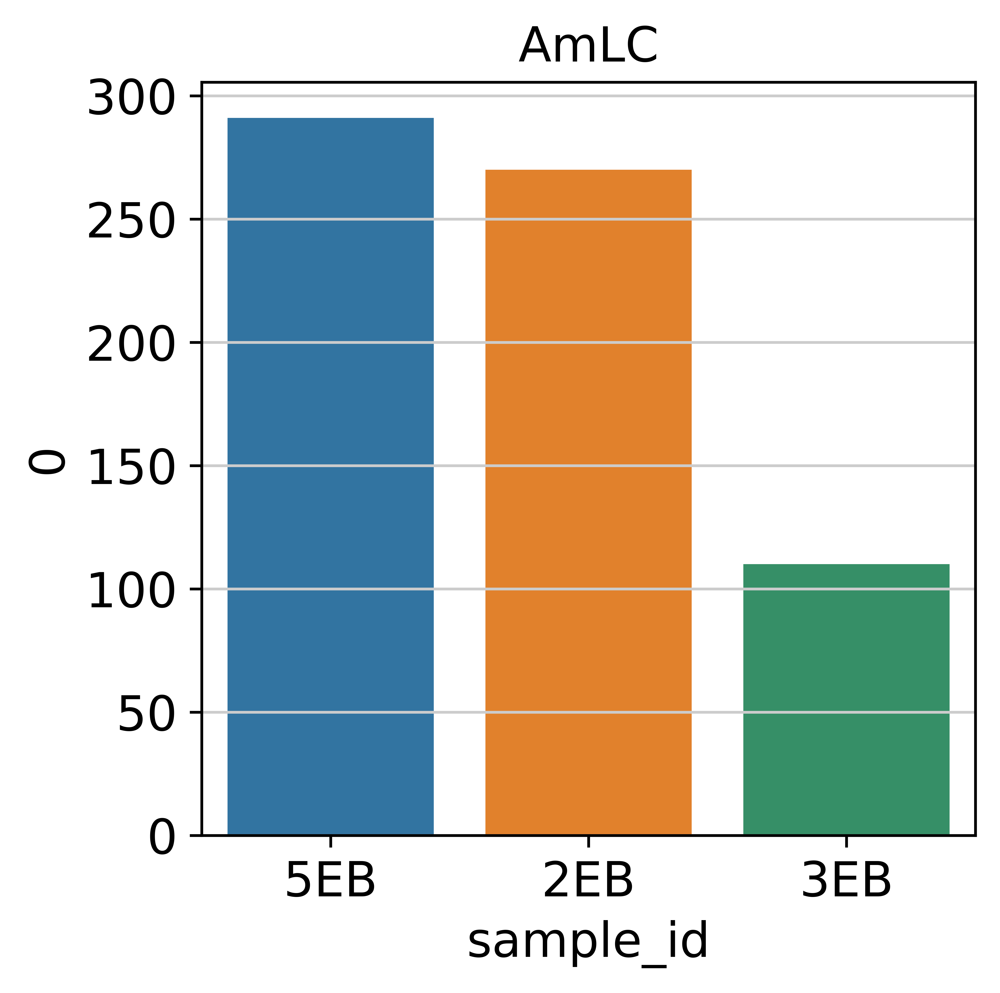

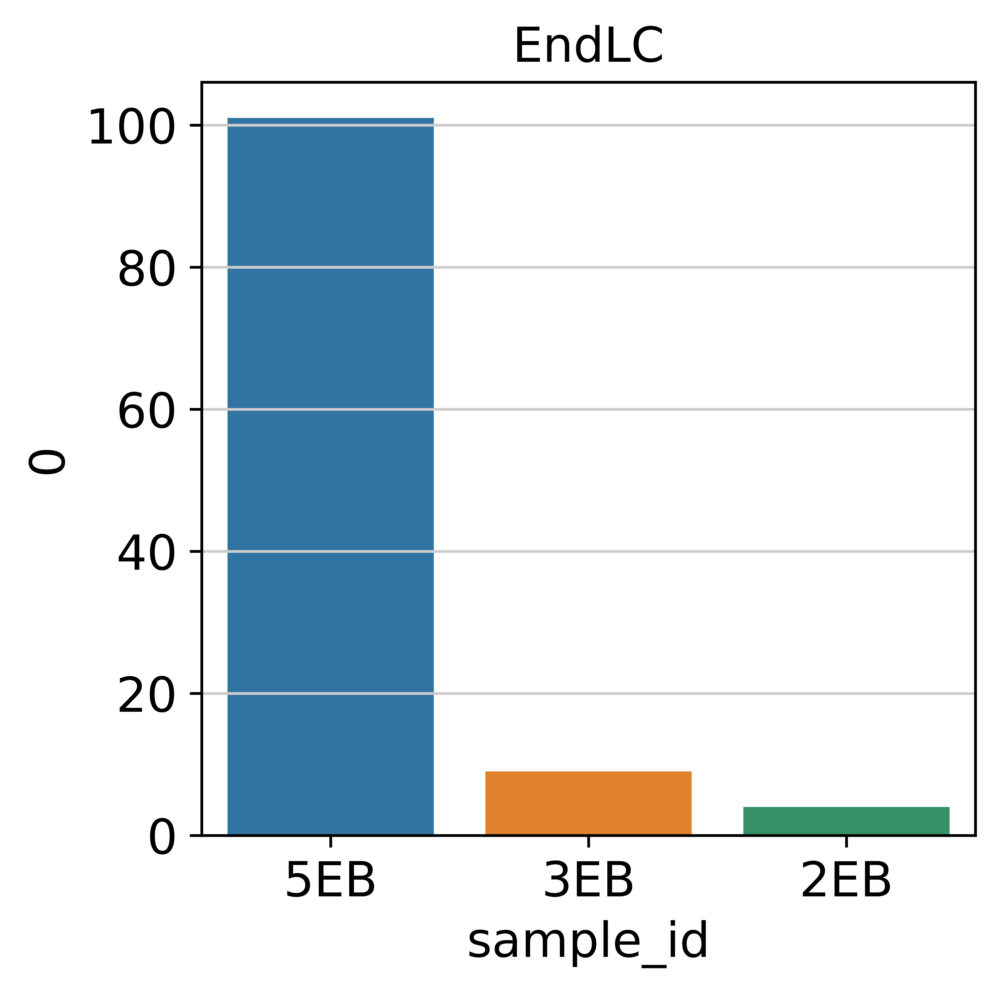

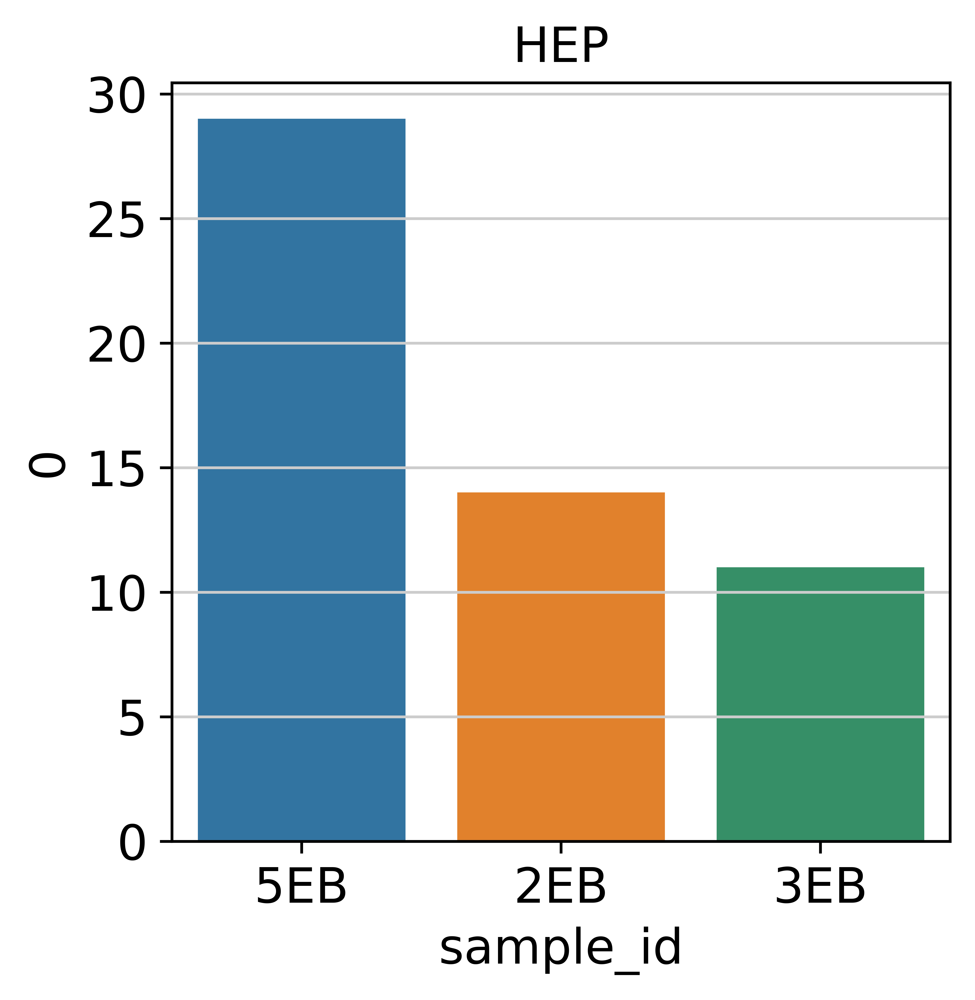

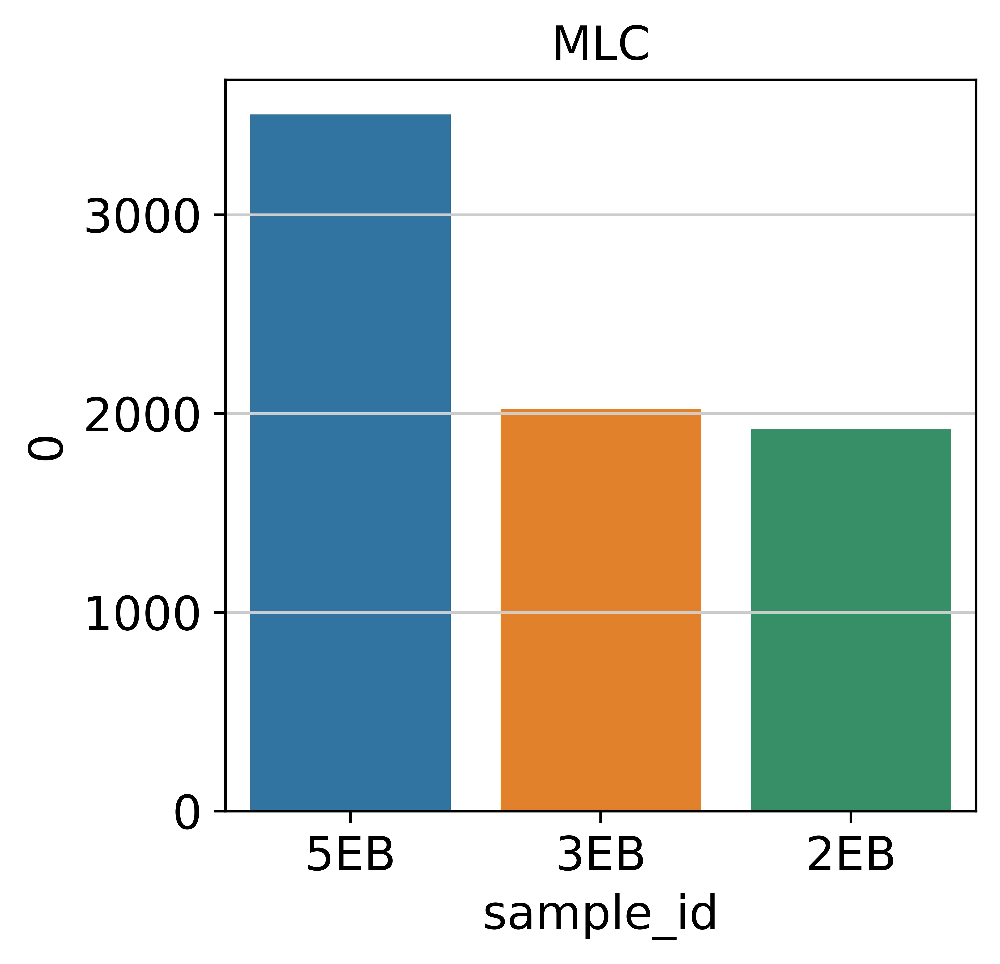

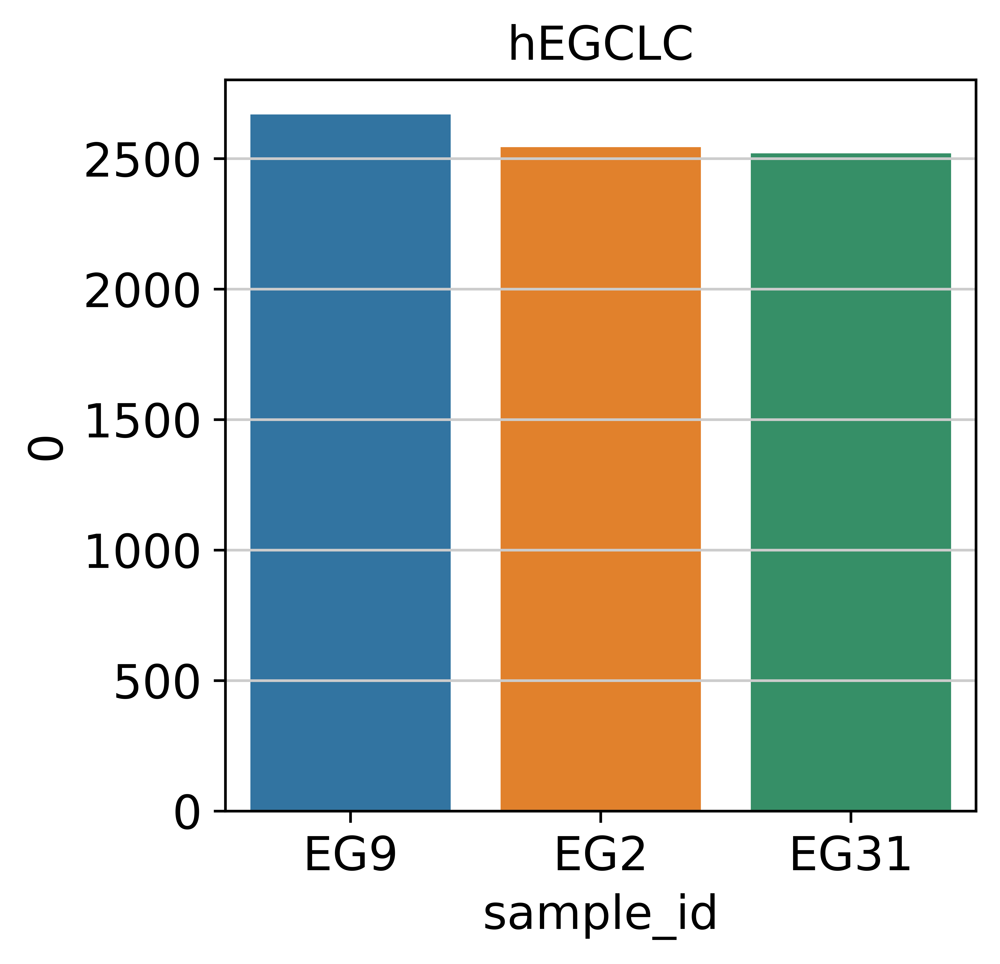

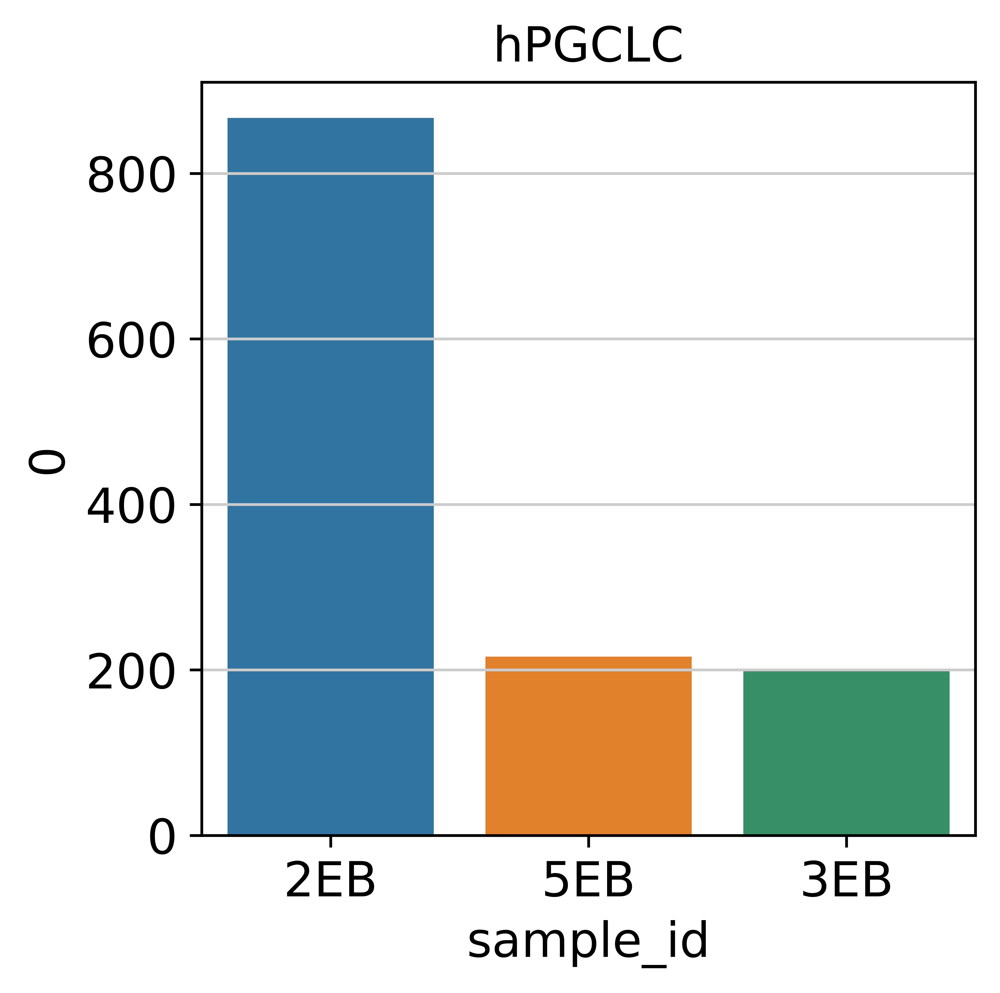

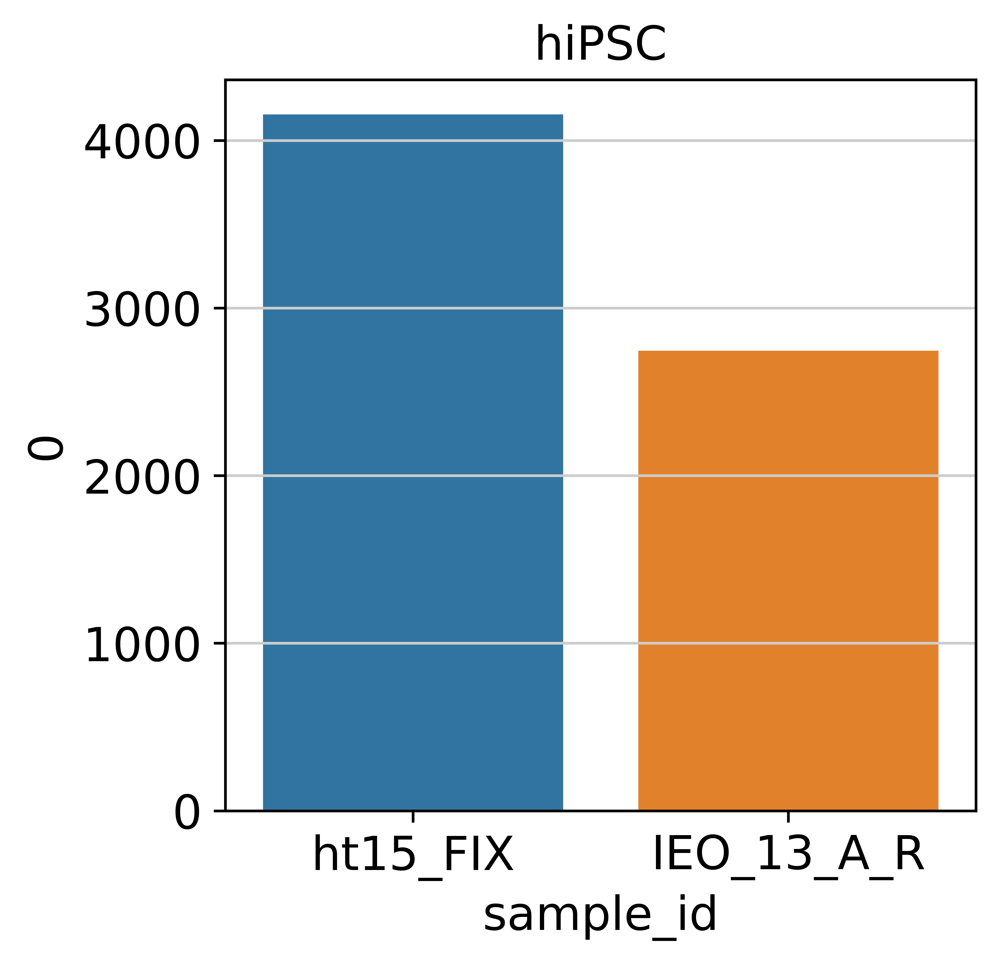

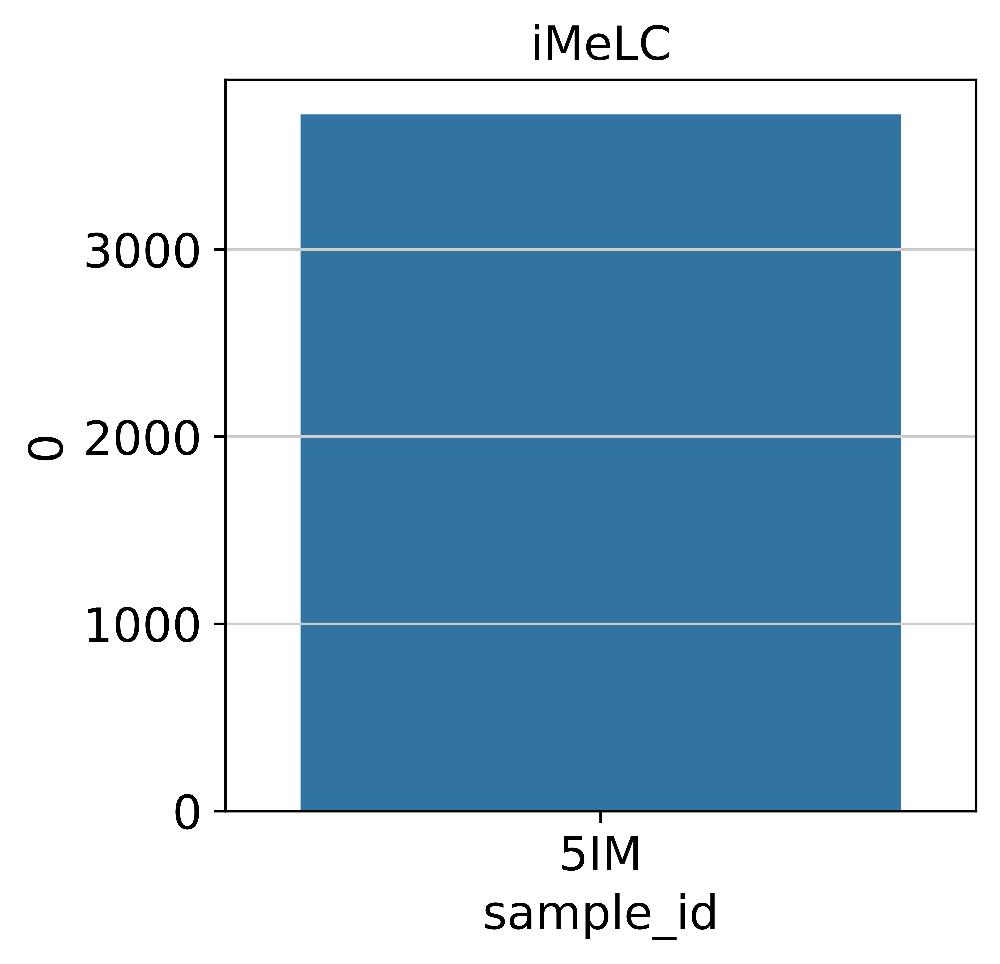

In [13]:
for ct in padata.obs.CellTypes.unique():
    sub = n_cells[n_cells.CellTypes == ct]
    sub.sample_id = sub.sample_id.astype('str')
    sns.barplot(y = sub[0], x = sub.sample_id )
    plt.title(ct)
    plt.show()

### Filter genes

In [14]:
genes_to_keep = filter_by_expr(padata, group = 'CellTypes', min_count = 10, min_total_count = 200, min_prop=0)
padata = padata[:, genes_to_keep]

padata.layers['raw'] = padata.X

sc.pp.normalize_total(padata, target_sum = 1e6)
sc.pp.log1p(padata)

obs = padata.obs

In [15]:
padata

AnnData object with n_obs × n_vars = 19 × 12733
    obs: 'sample_id', 'run_id', 'probe_barcode_ids', 'subject', 'line', 'specimen', 'stage', 'condition', 'seqRun', 'original_name', 'SC_derivation', 'micoplasma', 'scDblFinder_class', 'CellTypes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'lib_size', 'log_lib_size'
    var: 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p'
    layers: 'raw'

In [16]:
sc.tl.pca(padata)

In [17]:
sc.pl.pca(padata, color=padata.obs, ncols=2, size=300, components = ['1,2', '2,3'], wspace = 0.4)

ValueError: Image size of 13440x110400 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 6720x55200 with 64 Axes>

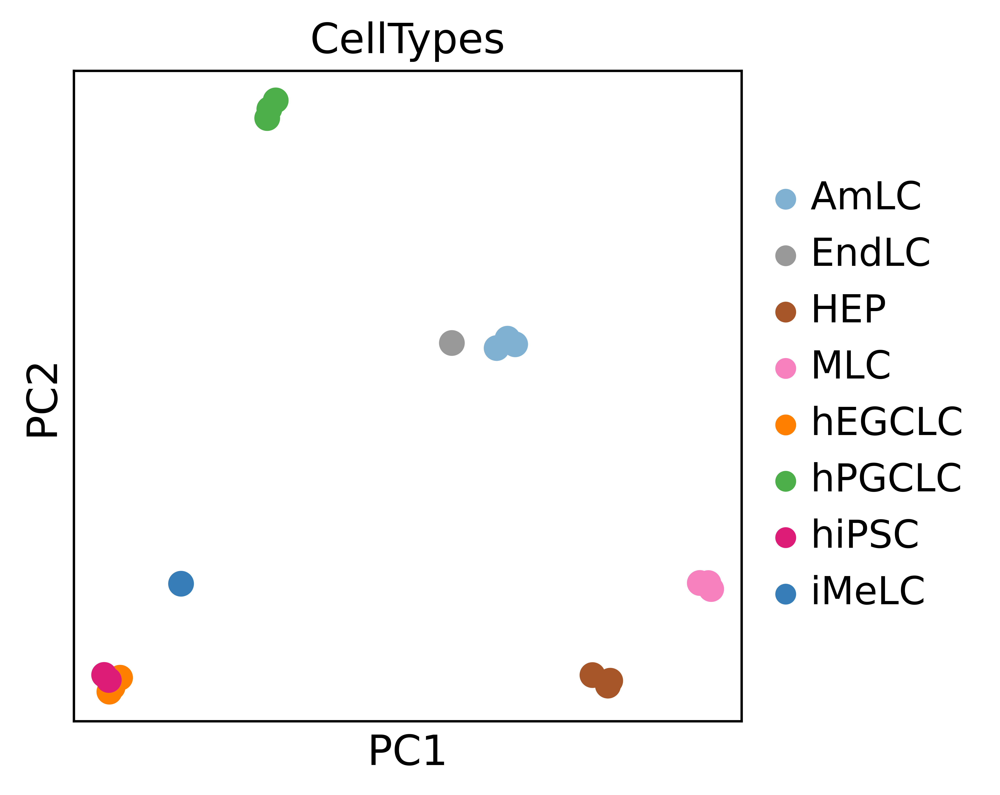

In [18]:
sc.settings._vector_friendly=False
sc.pl.pca(padata, color=['CellTypes'], size=300, palette=color_palette, save = '_pseudobulk.pdf')
sc.settings._vector_friendly=True

In [19]:
padata.write( './3_Pseudobulk_total.h5ad')

In [20]:
padata.layers['normalized'] = padata.X
padata.X = padata.layers['raw']

In [21]:
padata

AnnData object with n_obs × n_vars = 19 × 12733
    obs: 'sample_id', 'run_id', 'probe_barcode_ids', 'subject', 'line', 'specimen', 'stage', 'condition', 'seqRun', 'original_name', 'SC_derivation', 'micoplasma', 'scDblFinder_class', 'CellTypes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'lib_size', 'log_lib_size'
    var: 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'pca', 'sample_id_colors', 'run_id_colors', 'probe_barcode_ids_colors', 'subject_colors', 'line_colors', 'specimen_colors', 'stage_colors', 'condition_colors', 'seqRun_colors', 'original_name_colors', 'SC_derivation_colors', 'micoplasma_colors', 'scDblFinder_class_colors', 'CellTypes_colors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'raw', 'normalized'

In [22]:
total = pd.DataFrame(padata.layers['normalized'].T, columns = padata.obs_names, index = padata.var_names)

total.index = padata.var_names
total.columns = padata.obs_names

## Correlation between celltypes expression

In [23]:
sns.clustermap(total.corr(method = 'spearman'), vmin = 0, vmax = 1, cmap = 'PuBu')

In [24]:
spearman_corr = total.corr(method='spearman')

cbar_kws = {"shrink": 0.75, "label": "Spearman Correlation coefficient"}
plt.tight_layout(pad=0.7, w_pad=2, h_pad=4)

clustermap = sns.clustermap(spearman_corr, vmin=0, vmax=1, cmap='PuBu', annot=False, fmt=".2f", 
                            cbar_kws=cbar_kws, figsize=(20, 20))

clustermap.fig.suptitle('Spearman Correlation Coefficient between Cell Types', fontsize=30, y=1.01)

plt.savefig('./figures/Spearman_corr_celltypes.pdf')
plt.show()

<Figure size 2400x2400 with 0 Axes>

# Boxplots of markers
For fig. 2B and 2L of the paper

In [25]:
padata.X = padata.layers['normalized']
padata.X = sparse.csr_matrix(padata.X)

In [26]:
plot_box(
    padata,
   ['NANOS3', 'SOX17', 'CD38', 'TFAP2C', 'DNMT3L'],
    "CellTypes",
    order = ['hiPSC', 'iMeLC', 'hPGCLC', 'hEGCLC'],
    ncols=5,
    row_height = 4,
    save = './figures/boxplots_hPGCLC_up_markers.pdf'
)

In [27]:
plot_box(
    padata,
   ['SOX2', 'SOX3', 'ZIC5', 'SALL1', 'DNMT3B'],
    "CellTypes",
    order = ['hiPSC', 'iMeLC', 'hPGCLC', 'hEGCLC'],
    ncols=5,
    row_height = 4,
    save = './figures/boxplots_hPGCLC_down_markers.pdf'
)

In [28]:
plot_box(
    padata,
   ['PIWIL2'],
    "CellTypes",
    order = ['hiPSC', 'iMeLC', 'hPGCLC', 'hEGCLC'],
    ncols=4,
    row_height = 4,
    save = './figures/boxplots_PIWIL2.pdf'
)

# Heatmaps of markers
For Fig. 4G and Supp. Fig. 4B:

In [29]:
selected_cell_types = ["hiPSC", "iMeLC", "hPGCLC", "hEGCLC"]  
selected = padata[padata.obs['CellTypes'].isin(selected_cell_types)].copy()
selected.obs['CellTypes'] = selected.obs['CellTypes'].astype('category')
selected.obs['CellTypes'].cat.reorder_categories(selected_cell_types, inplace=True)

TF_DM_DE = ['ELF3', 'ELK3',  'FOXP1', 'GATA3', 'LMO2', 'MSX2', 
            'OVOL2', 'PRRX2', 'RARB', 'TCF7', 'ZIC5']

meth = ["DNMT3A", "DNMT3B", "DNMT1", "UHRF1", "DNMT3L", "TET1", "TET2", "TET3", "ZFP57", "ZNF445"]

TF_DM_DE = CleanList(TF_DM_DE, padata)
meth = CleanList(meth, padata)

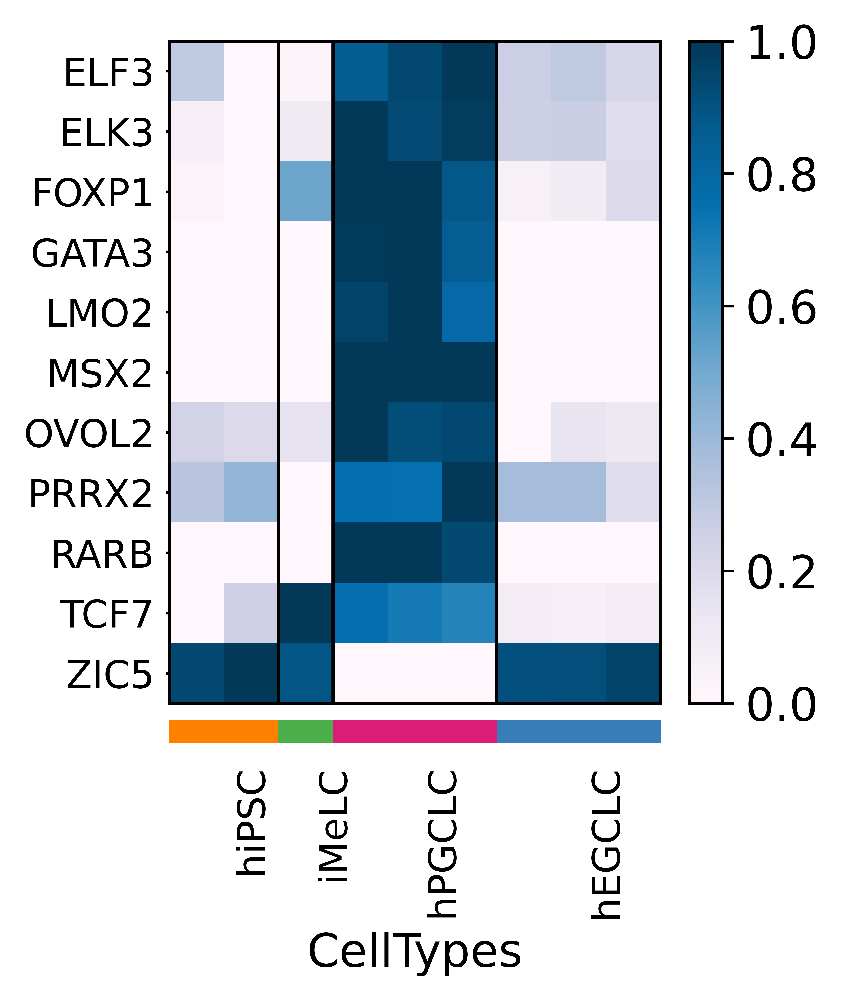

In [30]:
ax = sc.pl.heatmap(
              selected,
              TF_DM_DE,
              groupby = 'CellTypes', 
              cmap = 'PuBu', 
              swap_axes = True, 
              figsize = (3,4), 
              standard_scale = 'var', show = False
)

plt.savefig('TF_DM_DE_heatmap.pdf', dpi=600, bbox_inches = 'tight')
plt.show()

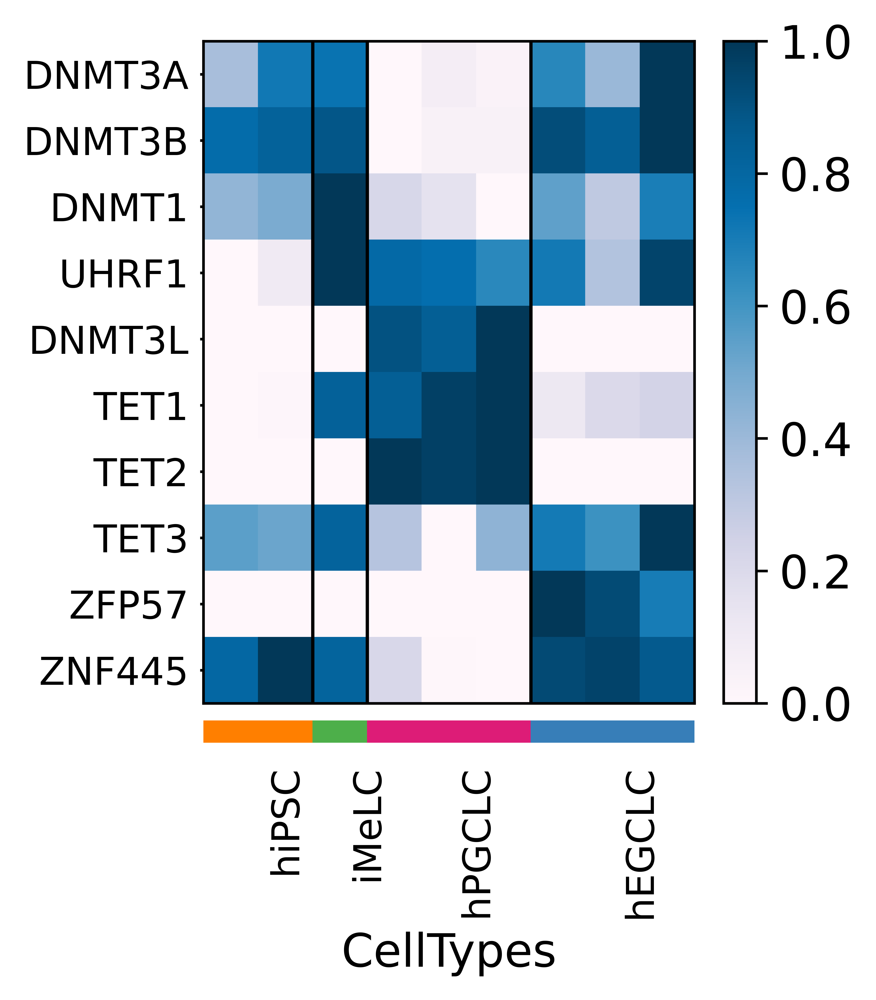

In [31]:
ax = sc.pl.heatmap(
              selected,
              meth,
              groupby = 'CellTypes', 
              cmap = 'PuBu', 
              swap_axes = True, 
              figsize = (3,4), 
              standard_scale = 'var', show = False
)

plt.savefig('meth_heatmap.pdf', dpi=600, bbox_inches = 'tight')
plt.show()

# Pseudobulk subset - EG vs iPSC

In [32]:
padata_sub = padata[padata.obs.specimen.isin(['hEGCLC', 'hiPSC']), :].copy()
padata_sub.X = padata_sub.layers['raw'].copy()

In [33]:
sc.pp.normalize_total(padata_sub, target_sum=1e6)
sc.pp.log1p(padata_sub)
sc.tl.pca(padata_sub)

In [34]:
sc.pl.pca(padata_sub, color=['CellTypes'], ncols=2, size=300, components = ['1,2', '2,3'], wspace = 0.4)

In [35]:
sc.pl.pca(padata_sub, color=['specimen'], ncols=2, size=300, components = ['1,2', '2,3', '3,4'], wspace = 0.4)

In [36]:
sc.pl.pca_loadings(padata_sub)

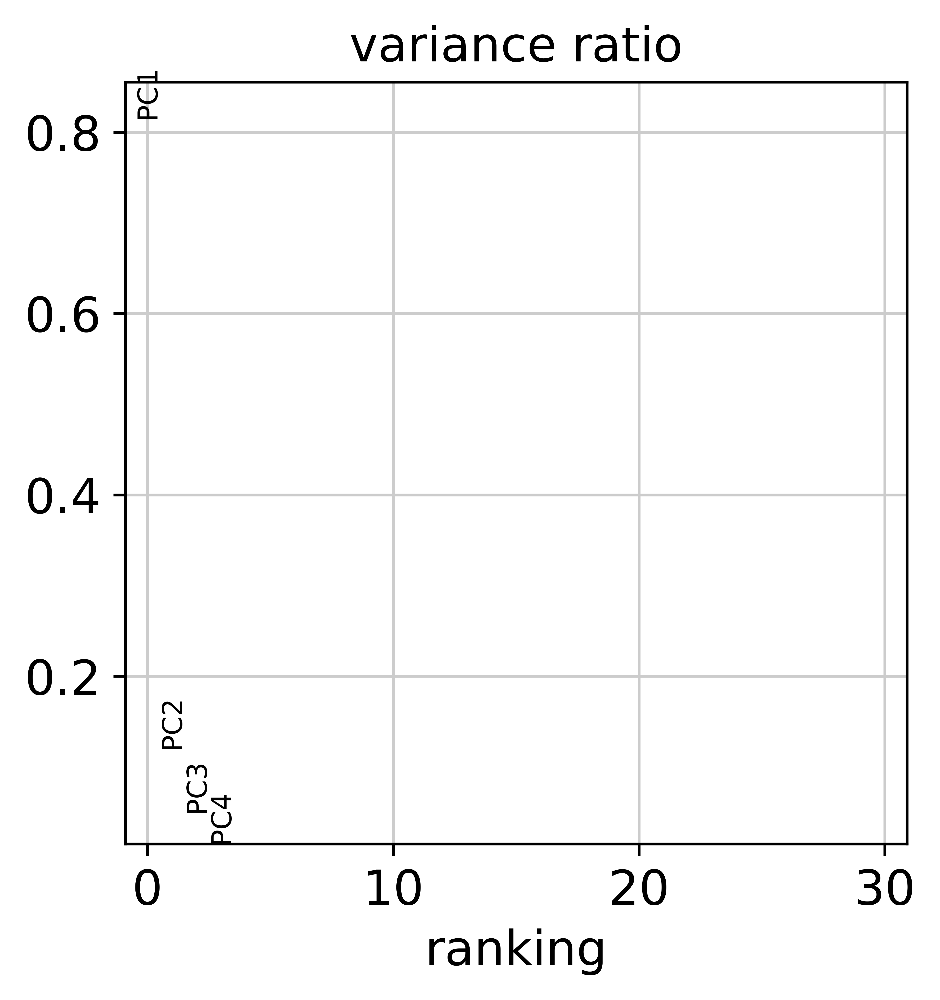

In [37]:
sc.pl.pca_variance_ratio(padata_sub)

Genes more positively associated with hEGCLCs:

In [38]:
pcs_genes = pd.DataFrame(padata_sub.varm['PCs'][:,0])
pcs_genes.index = padata_sub.var_names
pcs_genes.columns = ['PC1']
pcs_genes.sort_values(by = 'PC1', ascending = True).head(20)

,PC1
SERPINE1,-0.065397
PIWIL2,-0.059823
MAGEA4,-0.059599
PPP1R17,-0.057174
TMSB4Y,-0.056529
ZFP57,-0.055025
RBM46,-0.054333
MT1H,-0.053016
ZBED6CL,-0.052213
CRYAB,-0.051795
